In [ ]:
!pip install super-gradients

In [ ]:
%%capture
!pip install imutils
!pip install super_gradients==3.0.7
!pip install albumentations
!pip install split-folders[full]

In [ ]:
import os
import math
import random
from typing import Dict, List,Tuple
import requests

import numpy as np
import matplotlib.pyplot as plt
import glob
from pathlib import Path, PurePath
import pathlib
import pandas as pd

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import datasets
from torchvision import transforms

from PIL import Image

import albumentations as A
from albumentations.pytorch import ToTensorV2

from sklearn.model_selection import train_test_split

from imutils import paths

import splitfolders
import textwrap

import super_gradients
from super_gradients.common.object_names import Models
from super_gradients.training import Trainer
from super_gradients.training import training_hyperparams
from super_gradients.training.metrics.classification_metrics import Accuracy, Top5
from super_gradients.training.utils.early_stopping import EarlyStop
from super_gradients.training import models
from super_gradients.training.utils.callbacks import Phase

In [ ]:
!pip install kaggle

In [ ]:
from google.colab import files
files.upload()

{'kaggle (8).json': b'{"username":"boomikaezhilarasan","key":"821b2e211c98d2b7330b27fcbbc863ac"}'}

Saving kaggle (8).json to kaggle (8).json


In [ ]:
import shutil
shutil.move('kaggle (8).json', 'kaggle.json')

'kaggle.json'

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d vencerlanz09/sea-animals-image-dataste

Dataset URL: https://www.kaggle.com/datasets/vencerlanz09/sea-animals-image-dataste
License(s): other
 99% 310M/312M [00:05<00:00, 35.4MB/s]
100% 312M/312M [00:05<00:00, 57.2MB/s]


In [ ]:
!unzip sea-animals-image-dataste.zip -d sea_animals_data

Streaming output truncated to the last 5000 lines.
  inflating: sea_animals_data/Sea Urchins/Urchins (56).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (57).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (58).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (59).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (6).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (60).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (61).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (62).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (63).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (64).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (65).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (66).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (67).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (68).jpg  
  inflating: sea_animals_data/Sea Urchins/Urchins (69).jpg  
  inflating: sea_animals_data/Sea U

In [ ]:
from pathlib import Path

def count_subdirectories(path: str) -> int:
    dir_path = Path(path)
    subdirectories = [f for f in dir_path.iterdir() if f.is_dir()]
    return len(subdirectories)

parent_dir = "/content/sea_animals_data"
num_subdirectories = count_subdirectories(parent_dir)
print(f"Number of subdirectories in {parent_dir}: {num_subdirectories}")

Number of subdirectories in /content/sea_animals_data: 23


In [ ]:
class config:
    DATA_DIR = Path('/content/sea_animals_data')
    ROOT_DIR = Path('.')
    TRAIN_DIR = ROOT_DIR.joinpath('train')
    TEST_DIR = ROOT_DIR.joinpath('test')
    VAL_DIR = ROOT_DIR.joinpath('val')
    INPUT_HEIGHT = 224
    INPUT_WIDTH = 224
    IMAGENET_MEAN = [0.485, 0.456, 0.406]
    IMAGENET_STD = [0.229, 0.224, 0.225]
    BATCH_SIZE = 32
    MODEL_NAME = 'regnetY800'
    DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
    TRAINING_PARAMS = 'training_hyperparams/default_train_params'
    NUM_CLASSES = num_subdirectories
    CHECKPOINT_DIR = 'checkpoints'

In [ ]:
splitfolders.ratio(config.DATA_DIR, output=config.ROOT_DIR, seed=42, ratio=(.8, .1, .1), group_prefix=None, move=False)

Copying files: 12883 files [00:03, 3230.57 files/s]

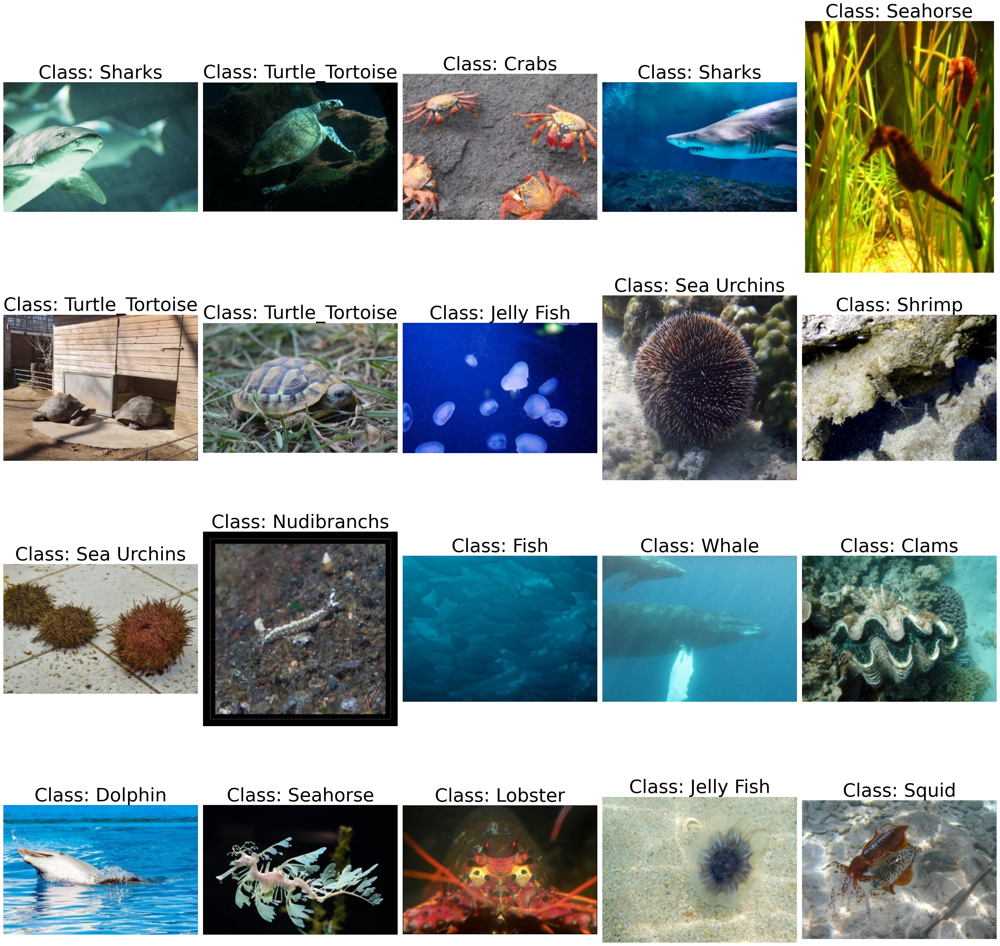

In [ ]:
train_image_path_list = list(sorted(paths.list_images(config.TRAIN_DIR)))
train_image_path_sample = random.sample(population=train_image_path_list, k=20)

def examine_images(images:list):
    num_images = len(images)
    num_rows = int(math.ceil(num_images/5))
    num_cols = 5

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(30, 30),tight_layout=True)
    axs = axs.ravel()

    for i, image_path in enumerate(images[:num_images]):
        image = Image.open(image_path)
        label = PurePath(image_path).parent.name
        axs[i].imshow(image)
        axs[i].set_title(f"Class: {label}", fontsize=40)
        axs[i].axis('off')
    plt.show()

examine_images(train_image_path_sample)

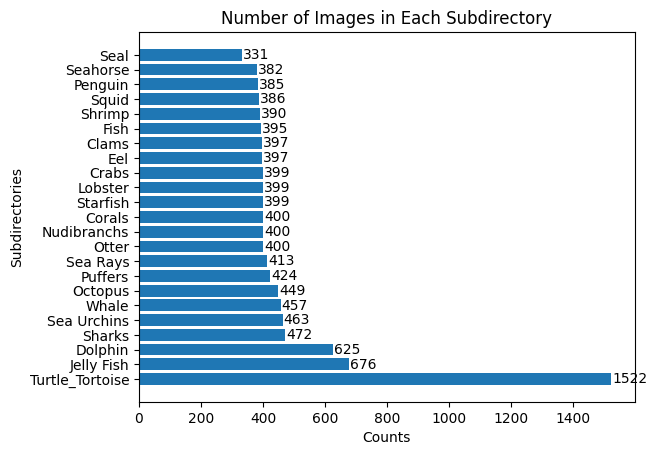

In [ ]:
subdirs = [d for d in Path(config.TRAIN_DIR).iterdir() if d.is_dir()]
image_count = {}
for subdir in subdirs:
    subdir_images = list(sorted(paths.list_images(subdir)))
    image_count[subdir.name] = len(subdir_images)

sorted_subdirs = [k for k, v in sorted(image_count.items(), key=lambda item: item[1], reverse=True)]
plt.barh(sorted_subdirs, sorted(image_count.values(), reverse=True))

for i, subdir in enumerate(sorted_subdirs):
    count = image_count[subdir]
    plt.text(count + 3, i, str(count), va='center')

plt.title("Number of Images in Each Subdirectory")
plt.xlabel("Counts")
plt.ylabel("Subdirectories")
plt.show()

In [ ]:
resize = transforms.Resize(size=(config.INPUT_HEIGHT,config.INPUT_WIDTH))
make_tensor = transforms.ToTensor()
normalize = transforms.Normalize(mean=config.IMAGENET_MEAN, std=config.IMAGENET_STD)
center_cropper = transforms.CenterCrop((config.INPUT_HEIGHT,config.INPUT_WIDTH))
random_horizontal_flip = transforms.RandomHorizontalFlip(p=0.75)
random_vertical_flip = transforms.RandomVerticalFlip(p=0.75)
random_rotation = transforms.RandomRotation(degrees=90)
random_crop = transforms.RandomCrop(size=(200,200))
augmix = transforms.AugMix(severity = 3, mixture_width=3, alpha=0.2)
auto_augment = transforms.AutoAugment()
random_augment = transforms.RandAugment()

train_transforms = transforms.Compose([
  resize,
  auto_augment,
  augmix,
  random_augment,
  make_tensor,
  normalize
])

val_transforms = transforms.Compose([resize, make_tensor, normalize])

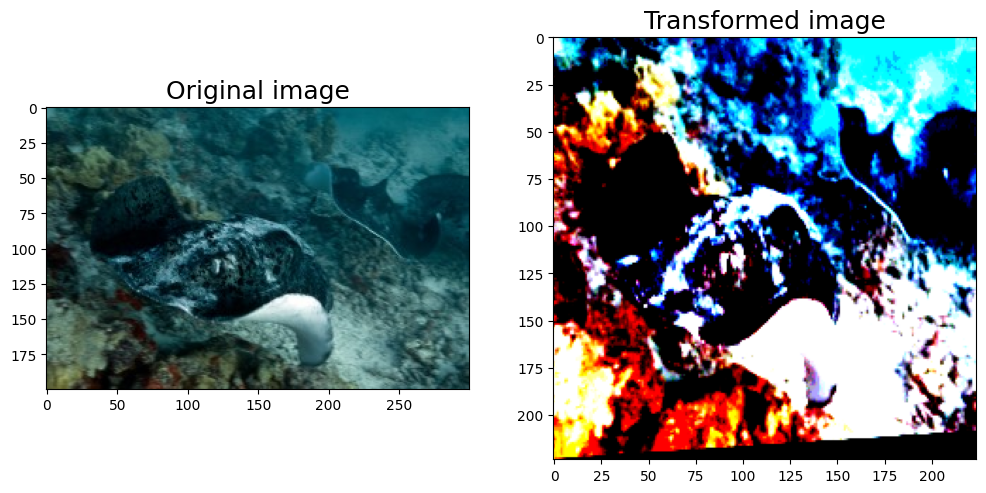

In [ ]:
def apply_transform(img: Image, transform) -> np.ndarray:
    if isinstance(transform, torchvision.transforms.Compose):
        transformed_image = train_transforms(img)

    elif isinstance(transform, A.Compose):
        img_array = np.array(img)
        transformed_image = transform(image=img_array)["image"]
    img_array = transformed_image.numpy().transpose((1, 2, 0))
    img_array = np.clip(img_array, 0, 1)

    return img_array


def visualize_transform(image: np.ndarray, original_image: np.ndarray = None) -> None:
    fontsize = 18

    if original_image is None:
        f, ax = plt.subplots(1, 2, figsize=(12, 12))
        ax[0].imshow(image)
    else:
        f, ax = plt.subplots(1, 2, figsize=(12, 12))
        ax[0].imshow(original_image)
        ax[0].set_title('Original image', fontsize=fontsize)
        ax[1].imshow(image)
        ax[1].set_title('Transformed image', fontsize=fontsize)

img = Image.open(random.choice(train_image_path_list))
img_array = apply_transform(img, train_transforms)
visualize_transform(img_array, original_image=img)

In [ ]:
def create_dataloaders(
    train_dir: str,
    val_dir: str,
    test_dir: str,
    train_transform: transforms.Compose,
    val_transform:  transforms.Compose,
    test_transform:  transforms.Compose,
    batch_size: int,
    num_workers: int=2
):
    train_data = datasets.ImageFolder(train_dir, transform=train_transform)
    val_data = datasets.ImageFolder(val_dir, transform=val_transform)
    test_data = datasets.ImageFolder(test_dir, transform=test_transform)

    print(f"[INFO] training dataset contains {len(train_data)} samples...")
    print(f"[INFO] validation dataset contains {len(val_data)} samples...")
    print(f"[INFO] test dataset contains {len(test_data)} samples...")

    class_names = train_data.classes
    print(f"[INFO] dataset contains {len(class_names)} labels...")
    print("[INFO] creating training, validation, and test set dataloaders...")
    train_dataloader = DataLoader(
        train_data,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
        num_workers=num_workers,
        pin_memory=True,
        persistent_workers=True
    )
    val_dataloader = DataLoader(
        val_data,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=False,
        persistent_workers=True
    )

    test_dataloader = DataLoader(
        test_data,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=False,
        persistent_workers=True
    )

    return train_dataloader, val_dataloader, test_dataloader, class_names

train_dataloader, val_dataloader, test_dataloader, class_names = create_dataloaders(
    train_dir=config.TRAIN_DIR,
    val_dir=config.VAL_DIR,
    test_dir=config.TEST_DIR,
    train_transform=train_transforms,
    val_transform=val_transforms,
    test_transform=val_transforms,
    batch_size=config.BATCH_SIZE
)

NUM_CLASSES = len(class_names)
training_params = training_hyperparams.get(config.TRAINING_PARAMS)

early_stop_acc = EarlyStop(Phase.VALIDATION_EPOCH_END, monitor="Accuracy", mode="max", patience=7, verbose=False)
early_stop_val_loss = EarlyStop(Phase.VALIDATION_EPOCH_END, monitor="LabelSmoothingCrossEntropyLoss", mode="min", patience=7, verbose=False)

training_params["train_metrics_list"] = [Accuracy(), Top5()]
training_params["valid_metrics_list"] = [Accuracy(), Top5()]
training_params["phase_callbacks"] = [early_stop_acc, early_stop_val_loss]

training_params["silent_mode"] = False
training_params["optimizer"] = 'AdamW'
training_params["criterion_params"] = {'smooth_eps': 0.20}
training_params["max_epochs"] = 5
training_params["initial_lr"] = 0.0001
training_params["loss"] = "cross_entropy"


[INFO] training dataset contains 10961 samples...
[INFO] validation dataset contains 1361 samples...
[INFO] test dataset contains 1389 samples...
[INFO] dataset contains 23 labels...
[INFO] creating training, validation, and test set dataloaders...


In [ ]:
model = models.get(config.MODEL_NAME, num_classes = config.NUM_CLASSES, pretrained_weights='imagenet')

[2024-09-12 05:19:18] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the imagenet dataset, published under the following terms: https://www.image-net.org/download.php
Downloading: "https://sghub.deci.ai/models/regnetY800_imagenet.pth" to /root/.cache/torch/hub/checkpoints/regnetY800_imagenet.pth
100%|██████████| 24.1M/24.1M [00:02<00:00, 9.02MB/s]
[2024-09-12 05:19:23] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture regnetY800


In [ ]:
full_model_trainer = Trainer(experiment_name='0_Baseline_Experiment', ckpt_root_dir=config.CHECKPOINT_DIR)

In [ ]:
train_dataloader, valid_dataloader, test_dataloader, class_names = create_dataloaders(train_dir=config.TRAIN_DIR,
                                                                     val_dir=config.VAL_DIR,
                                                                     test_dir=config.TEST_DIR,
                                                                     train_transform=train_transforms,
                                                                     val_transform=val_transforms,
                                                                     test_transform=val_transforms,
                                                                     batch_size=config.BATCH_SIZE)

NUM_CLASSES = len(class_names)

[INFO] training dataset contains 10961 samples...
[INFO] validation dataset contains 1361 samples...
[INFO] test dataset contains 1389 samples...
[INFO] dataset contains 23 labels...
[INFO] creating training, validation, and test set dataloaders...


In [ ]:
training_params =  training_hyperparams.get(config.TRAINING_PARAMS)

In [ ]:
from super_gradients.training.utils.early_stopping import EarlyStop
from super_gradients.training.utils.callbacks import Phase
from super_gradients.training.metrics import Accuracy, Top5
early_stop_acc = EarlyStop(Phase.VALIDATION_EPOCH_END, monitor="Accuracy", mode="max", patience=7, verbose=False)
early_stop_val_loss = EarlyStop(Phase.VALIDATION_EPOCH_END, monitor="CrossEntropyLoss", mode="min", patience=7, verbose=False)

training_params = {
    "train_metrics_list": [Accuracy(), Top5()],
    "valid_metrics_list": [Accuracy(), Top5()],
    "phase_callbacks": [early_stop_acc, early_stop_val_loss],
    "silent_mode": False,
    "optimizer": 'AdamW',
    "criterion_params": {'smooth_eps': 0.20},
    "max_epochs": 4,
    "initial_lr": 0.0001,
    "loss": "cross_entropy"
}
full_model_trainer.train(
    model=model,
    training_params=training_params,
    train_loader=train_dataloader,
    valid_loader=valid_dataloader
)


[2024-09-13 08:27:50] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20240913_082750_837235`
[2024-09-13 08:27:50] INFO - sg_trainer.py - Checkpoints directory: checkpoints/0_Baseline_Experiment/RUN_20240913_082750_837235
/usr/local/lib/python3.10/dist-packages/super_gradients/common/registry/registry.py:72: DeprecationWarning: Object name `cross_entropy` is now deprecated. Please replace it with `CrossEntropyLoss`.
  warnings.warn(f"Object name `{name}` is now deprecated. Please replace it with `{deprecated_names[name]}`.", DeprecationWarning)
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/optimizer_utils.py:108: DeprecationWarning: initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
  warning

The console stream is now moved to checkpoints/0_Baseline_Experiment/RUN_20240913_082750_837235/console_Sep13_08_27_50.txt


/usr/local/lib/python3.10/dist-packages/super_gradients/training/sg_trainer/sg_trainer.py:502: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=self.training_params.mixed_precision):
Validating: 100%|██████████| 43/43 [01:36<00:00,  2.24s/it]
[2024-09-13 09:11:54] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/0_Baseline_Experiment/RUN_20240913_082750_837235/ckpt_best.pth
[2024-09-13 09:11:54] INFO - sg_trainer.py - Best checkpoint overriden: validation Accuracy: 0.7274063229560852
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/weight_averaging_utils.py:132: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SEC

SUMMARY OF EPOCH 0
├── Train
│   ├── Crossentropyloss = 2.4725
│   ├── Accuracy = 0.4021
│   └── Top5 = 0.7113
└── Validation
    ├── Crossentropyloss = 1.7575
    ├── Accuracy = 0.7274
    └── Top5 = 0.9434



Validating epoch 1:  93%|█████████▎| 40/43 [01:19<00:05,  1.71s/it]

In [ ]:
best_full_model = models.get(config.MODEL_NAME,
                        num_classes=config.NUM_CLASSES,
                        checkpoint_path=os.path.join(full_model_trainer.checkpoints_dir_path, "ckpt_best.pth"))

In [ ]:
full_model_trainer.test(model=best_full_model,
            test_loader=test_dataloader,
            test_metrics_list=['Accuracy', 'Top5'])

Testing:   0%|          | 0/44 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
Testing:  98%|█████████▊| 43/44 [00:06<00:00,  5.92it/s]

{'CrossEntropyLoss': 1.4091839,
 'Accuracy': 0.8689704537391663,
 'Top5': 0.9697624444961548}

Testing: 100%|██████████| 44/44 [00:06<00:00,  6.69it/s]


In [ ]:
import requests
def pred_and_plot_image(image_path: str,
                        subplot: Tuple[int, int, int],
                        class_names: List[str] = class_names,
                        model: torch.nn.Module = best_full_model,
                        image_size: Tuple[int, int] = (config.INPUT_HEIGHT, config.INPUT_WIDTH),
                        transform: torchvision.transforms = None,
                        device: torch.device=config.DEVICE):

    if isinstance(image_path, pathlib.PosixPath):
      img = Image.open(image_path)
    else:
      img = Image.open(requests.get(image_path, stream=True).raw)

    if transform is None:
        transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=config.IMAGENET_MEAN,
                                 std=config.IMAGENET_STD),
        ])
    transformed_image = transform(img)
    model.to(device)
    model.eval()
    with torch.inference_mode():
        transformed_image = transformed_image.unsqueeze(dim=0)
        target_image_pred = model(transformed_image.to(device))

    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)
    ground_truth = PurePath(image_path).parent.name
    plt.subplot(*subplot)
    plt.imshow(img)
    if isinstance(image_path, pathlib.PosixPath):
        title = f"Ground Truth: {ground_truth} | Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}"
    else:
        title = f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}"
    plt.title("\n".join(textwrap.wrap(title, width=20)))
    plt.axis(False)


def plot_random_test_images(model):
    num_images_to_plot = 30
    test_image_path_list = [pathlib.PosixPath(p) for p in sorted(paths.list_images(config.TEST_DIR))]
    test_image_path_sample = random.sample(population=test_image_path_list,
                                           k=num_images_to_plot)
    num_rows = int(np.ceil(num_images_to_plot / 5))
    fig, ax = plt.subplots(num_rows, 5, figsize=(15, num_rows * 3))
    ax = ax.flatten()
    for i, image_path in enumerate(test_image_path_sample):
        pred_and_plot_image(model=model,
                            image_path=image_path,
                            class_names=class_names,
                            subplot=(num_rows, 5, i+1),
                            image_size=(config.INPUT_HEIGHT, config.INPUT_WIDTH))

    plt.subplots_adjust(wspace=1)
    plt.show()

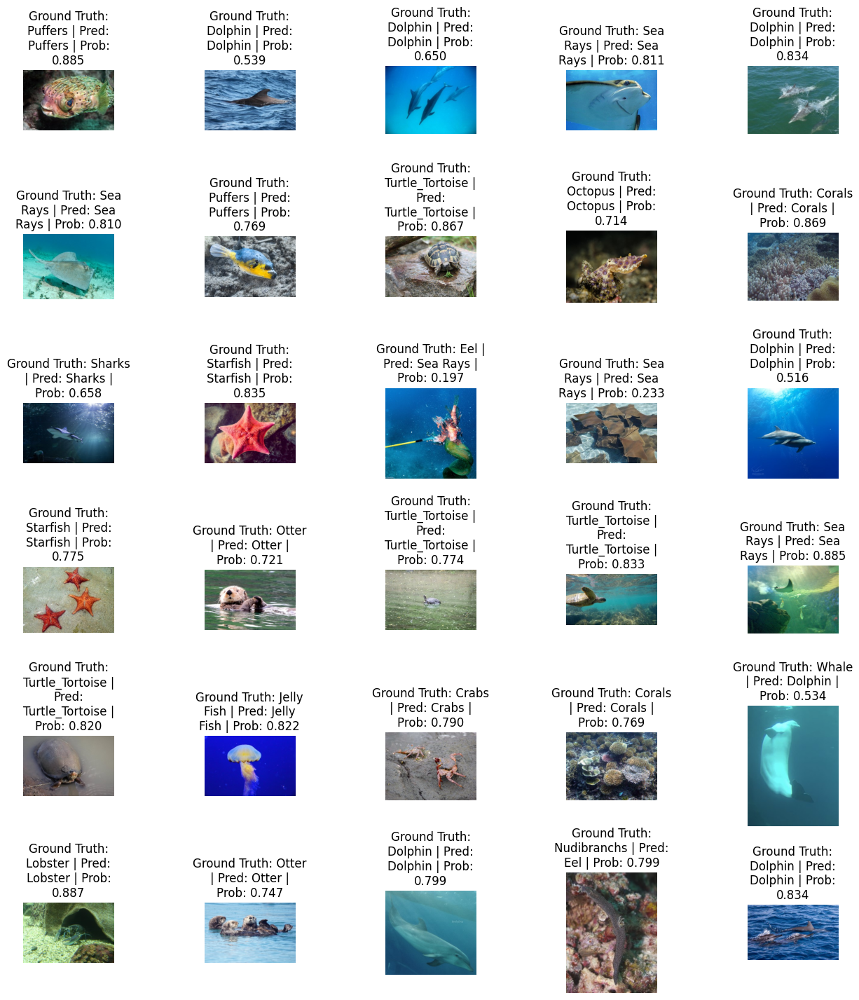

In [ ]:
plot_random_test_images(best_full_model)

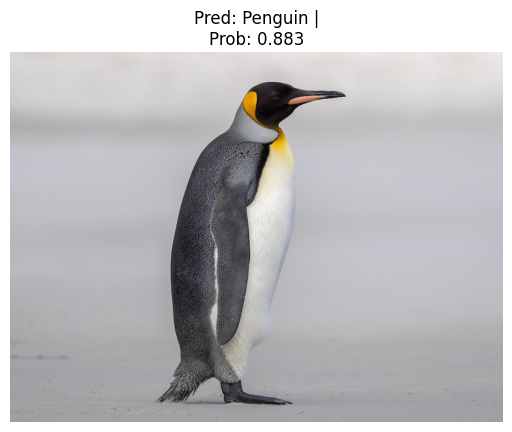

In [ ]:
image_path = '/content/penquin.jpg'
pred_and_plot_image(image_path=image_path, subplot=(1, 1, 1))

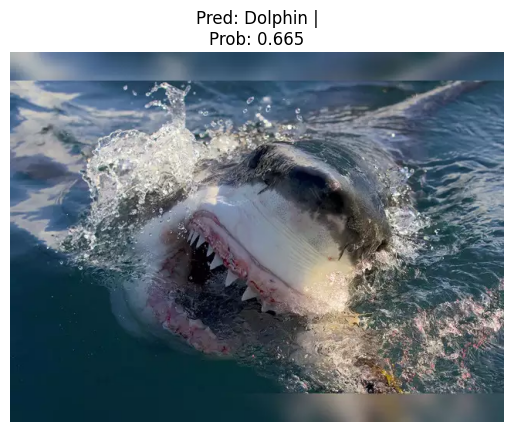

In [ ]:
image_path = '/content/s.jpg'
pred_and_plot_image(image_path=image_path, subplot=(1, 1, 1))

In [ ]:
import requests
def pred_and_plot_image(image_path: str,
                        subplot: Tuple[int, int, int],
                        class_names: List[str] = class_names,
                        model: torch.nn.Module = best_full_model,
                        image_size: Tuple[int, int] = (config.INPUT_HEIGHT, config.INPUT_WIDTH),
                        transform: torchvision.transforms = None,
                        device: torch.device=config.DEVICE):

    if isinstance(image_path, pathlib.PosixPath):
      img = Image.open(image_path)
    else:
      img = Image.open(image_path)

    if transform is None:
        transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=config.IMAGENET_MEAN,
                                 std=config.IMAGENET_STD),
        ])
    transformed_image = transform(img)

    model.to(device)
    model.eval()
    with torch.inference_mode():
        transformed_image = transformed_image.unsqueeze(dim=0)
        target_image_pred = model(transformed_image.to(device))
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)
    ground_truth = PurePath(image_path).parent.name
    plt.subplot(*subplot)
    plt.imshow(img)
    if isinstance(image_path, pathlib.PosixPath):
        title = f"Ground Truth: {ground_truth} | Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}"
    else:
        title = f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}"
    plt.title("\n".join(textwrap.wrap(title, width=20)))
    plt.axis(False)

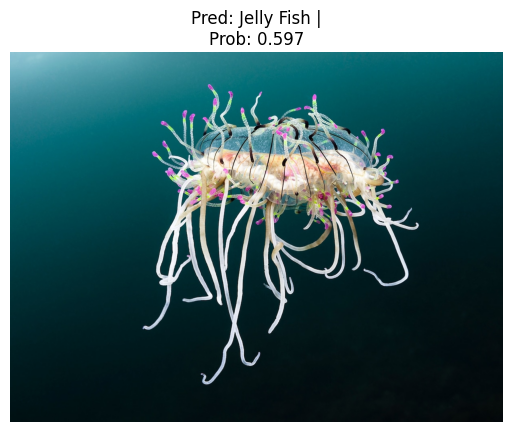

In [ ]:
image_path = 'https://i.natgeofe.com/n/c815916e-51e7-48a0-a485-742edefb48c6/naturepl_01606825_4x3.jpg?w=1224&h=918'
pred_and_plot_image(image_path=image_path, subplot=(1, 1, 1))

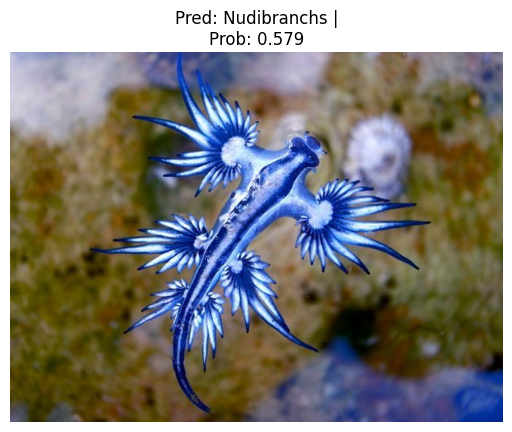

In [ ]:
image_path = 'https://www.earthrangers.com/public/content/wildwire/Glaucus-Atlanticus-blue-dr.jpg'
pred_and_plot_image(image_path=image_path, subplot=(1, 1, 1))

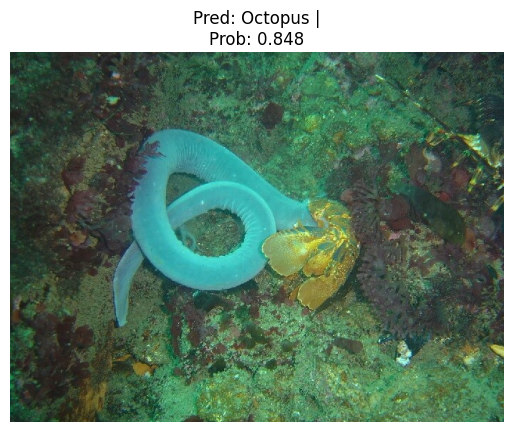

In [ ]:
image_path = 'https://greenglobaltravel.com/wp-content/uploads/2021/02/hagfish.jpg'
pred_and_plot_image(image_path=image_path, subplot=(1, 1, 1))

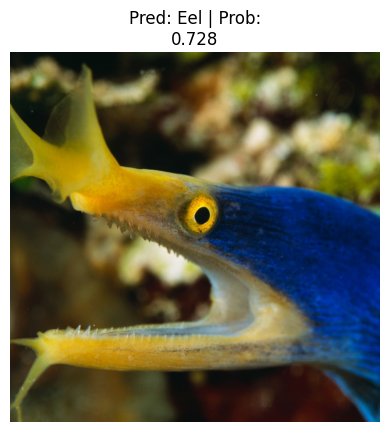

In [ ]:
image_path = 'https://i.natgeofe.com/n/1fd1003d-0799-49b9-a808-3b6950427b56/17467_square.jpg'
pred_and_plot_image(image_path=image_path, subplot=(1, 1, 1))

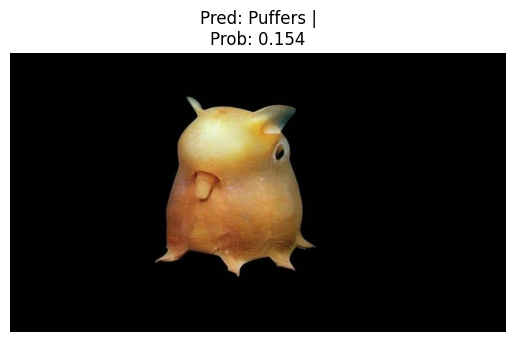

In [ ]:
image_path = 'https://c.files.bbci.co.uk/C7A5/production/_85790115_deep3.jpg'
pred_and_plot_image(image_path=image_path, subplot=(1, 1, 1))